In [212]:
import geopandas as gp
import pandas as pd
import folium
from folium.plugins import MarkerCluster
import datetime
import numpy as np

In [82]:
df = pd.read_csv("Wildland_Fire_Incident_Locations.csv")

/var/folders/dx/sc89948n7r9d_y3ms23yc8c40000gn/T/ipykernel_97208/1734720274.py:1: DtypeWarning: Columns (7,8,17,35,64,67,88,89,93,94) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("Wildland_Fire_Incident_Locations.csv")


### Dataset Description
The description of the dataset may be found here: https://data-nifc.opendata.arcgis.com/datasets/nifc::wildland-fire-incident-locations/about

In [83]:
columns = list(df.columns)
redcols = []
for i in columns:
    m = df[i].isna().sum()
    print(i, '                ', m)
    if m >0.5*df.shape[0]:
        redcols.append(i)


X                  0
Y                  0
OBJECTID                  0
SourceOID                  0
ABCDMisc                  237386
ADSPermissionState                  0
CalculatedAcres                  245041
ContainmentDateTime                  98989
ControlDateTime                  113776
CreatedBySystem                  0
IncidentSize                  75762
DiscoveryAcres                  64508
DispatchCenterID                  37378
EstimatedCostToDate                  235668
FinalAcres                  232228
FinalFireReportApprovedByTitle                  250391
FinalFireReportApprovedByUnit                  247775
FinalFireReportApprovedDate                  217087
FireBehaviorGeneral                  234747
FireBehaviorGeneral1                  243220
FireBehaviorGeneral2                  244393
FireBehaviorGeneral3                  246534
FireCause                  30649
FireCauseGeneral                  196147
FireCauseSpecific                  235689
FireCode               

In [84]:
df.drop(columns = redcols, inplace=True)
df.columns

Index(['X', 'Y', 'OBJECTID', 'SourceOID', 'ADSPermissionState',
       'ContainmentDateTime', 'ControlDateTime', 'CreatedBySystem',
       'IncidentSize', 'DiscoveryAcres', 'DispatchCenterID', 'FireCause',
       'FireCode', 'FireDiscoveryDateTime', 'FireOutDateTime', 'GACC',
       'IncidentName', 'IncidentTypeCategory', 'IncidentTypeKind',
       'InitialLatitude', 'InitialLongitude', 'IrwinID', 'IsFireCodeRequested',
       'IsFSAssisted', 'IsMultiJurisdictional', 'IsReimbursable', 'IsTrespass',
       'LocalIncidentIdentifier', 'POOCounty', 'POODispatchCenterID',
       'POOFips', 'POOJurisdictionalUnit', 'POOLandownerCategory',
       'POOLandownerKind', 'POOPredictiveServiceAreaID', 'POOProtectingAgency',
       'POOProtectingUnit', 'POOState', 'UniqueFireIdentifier',
       'WFDSSDecisionStatus', 'CreatedOnDateTime_dt', 'ModifiedOnDateTime_dt',
       'IsCpxChild', 'SourceGlobalID', 'GlobalID'],
      dtype='object')

<AxesSubplot: >

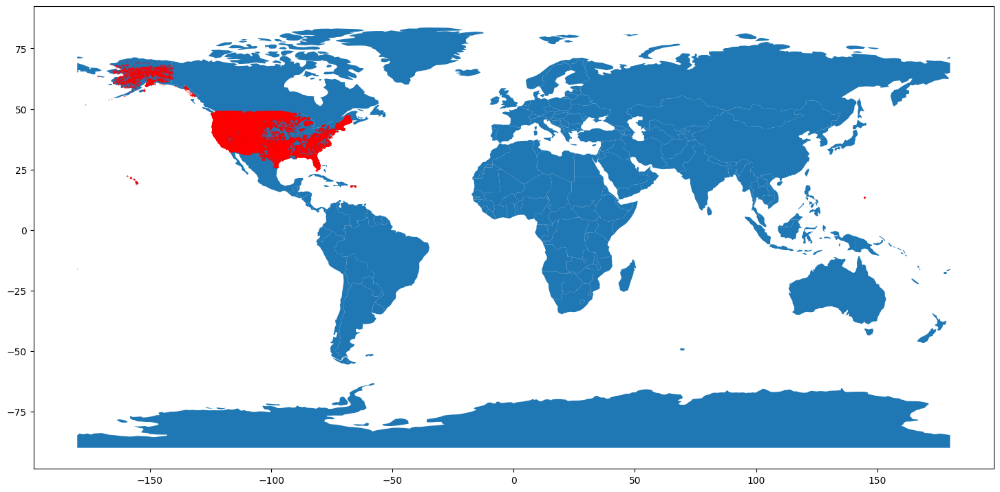

In [13]:
from shapely.geometry import Point
geometry = [Point(xy) for xy in zip(df['X'], df['Y'])]
gdf = gp.GeoDataFrame(df, geometry=geometry)
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
gdf.plot(ax=world.plot(figsize=(18, 12)), marker='o', color='red', markersize=.05)

In [12]:
df.IncidentSize

0           NaN
1           NaN
2           NaN
3           NaN
4           NaN
          ...  
250386    20.00
250387     0.76
250388    42.70
250389     1.00
250390    20.00
Name: IncidentSize, Length: 250391, dtype: float64

In [245]:
df_TX = df[df.POOState == 'US-TX']
df_TX['FireDiscoveryDateTime'] = pd.to_datetime(df_TX['FireDiscoveryDateTime'])
df_TX['FireYear'] = pd.DatetimeIndex(df_TX.FireDiscoveryDateTime).year
df_TX = df_TX[df_TX.FireYear>2015]

df_CA = df[df.POOState == 'US-CA']
df_CA['FireDiscoveryDateTime'] = pd.to_datetime(df_CA['FireDiscoveryDateTime'])
df_CA['FireYear'] = pd.DatetimeIndex(df_CA.FireDiscoveryDateTime).year
df_CA = df_CA[df_CA.FireYear>2015]

df_CO = df[df.POOState == 'US-CO']
df_CO['FireDiscoveryDateTime'] = pd.to_datetime(df_CO['FireDiscoveryDateTime'])
df_CO['FireYear'] = pd.DatetimeIndex(df_CO.FireDiscoveryDateTime).year
df_CO = df_CO[df_CO.FireYear>2015]


USmap = folium.Map(location=[30.622370, -96.325851], zoom_start=10, control_scale=True)
feature_group = folium.FeatureGroup("Locations")
marker_cluster = MarkerCluster().add_to(USmap)

#for i in range(50):
#df_TX.dropna(subset=['IncidentSize'],inplace=True)
for i in range(df_TX.shape[0]):
    lat = df_TX.iloc[i].Y
    lng = df_TX.iloc[i].X
    Year = df_TX.iloc[i].FireYear
    Month = df_TX.iloc[i].FireDiscoveryDateTime.month
    Day = df_TX.iloc[i].FireDiscoveryDateTime.day
    Kind = df_TX.iloc[i].IncidentTypeKind
    Name = df_TX.iloc[i].IncidentName
    Area = df_TX.iloc[i].IncidentSize
    Cause = df_TX.iloc[i].FireCause
    pop = 'Name= %s \n\n\n Date=%d/%d/%d \n\n\n Area=%.2f \n\n\n Kind= %s \n\n\n Cause = %s'%(Name, Month, Day, Year, Area, Kind, Cause)
    folium.Marker(location=[lat,lng],popup= pop, radius = 2, color = '#e25822',
                       icon = folium.Icon(icon='fire', color= '#e25822')).add_to(marker_cluster)
    #feature_group.add_child(folium.CircleMarker(location=[lat,lng],popup=ID, radius = .2, color = '#e25822' ))

USmap.save('Texas.html')
USmap


/var/folders/dx/sc89948n7r9d_y3ms23yc8c40000gn/T/ipykernel_97208/3439197174.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_TX['FireDiscoveryDateTime'] = pd.to_datetime(df_TX['FireDiscoveryDateTime'])
/var/folders/dx/sc89948n7r9d_y3ms23yc8c40000gn/T/ipykernel_97208/3439197174.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_TX['FireYear'] = pd.DatetimeIndex(df_TX.FireDiscoveryDateTime).year
/var/folders/dx/sc89948n7r9d_y3ms23yc8c40000gn/T/ipykernel_97208/3439197174.py:7: SettingWithCopyWarning:

<AxesSubplot: xlabel='FireYear'>

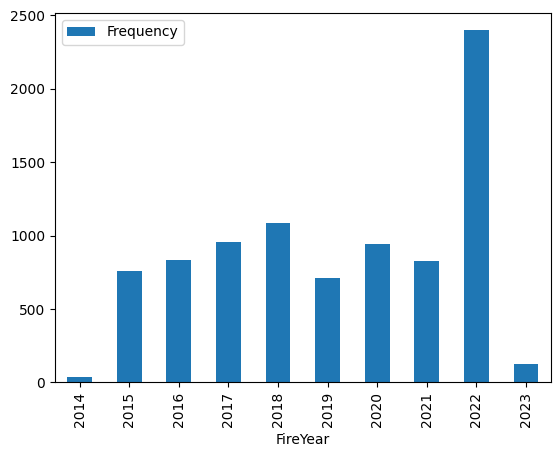

In [179]:
df_TX_frequency = pd.DataFrame(df_TX.FireYear.value_counts()).reset_index()
df_TX_frequency.columns = ['FireYear', 'Frequency']
df_TX_frequency.sort_values(by='FireYear', inplace=True)
df_TX_frequency[df_TX_frequency.FireYear>2013].plot(kind ='bar', x = 'FireYear')

<AxesSubplot: xlabel='FireYear'>

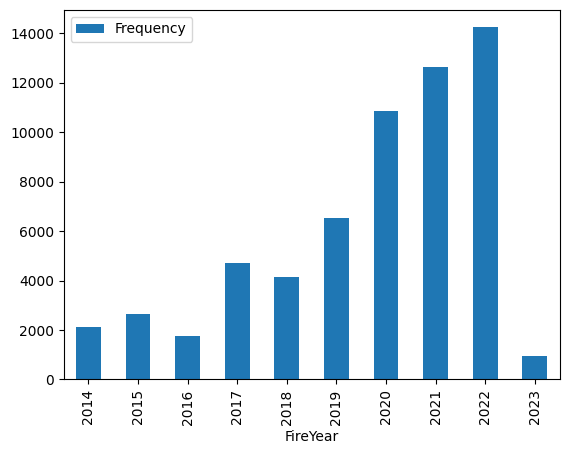

In [180]:
df_CA_frequency = pd.DataFrame(df_CA.FireYear.value_counts()).reset_index()
df_CA_frequency.columns = ['FireYear', 'Frequency']
df_CA_frequency.sort_values(by='FireYear', inplace=True)
df_CA_frequency[df_CA_frequency.FireYear>2013].plot(kind ='bar', x = 'FireYear')

<AxesSubplot: xlabel='FireYear'>

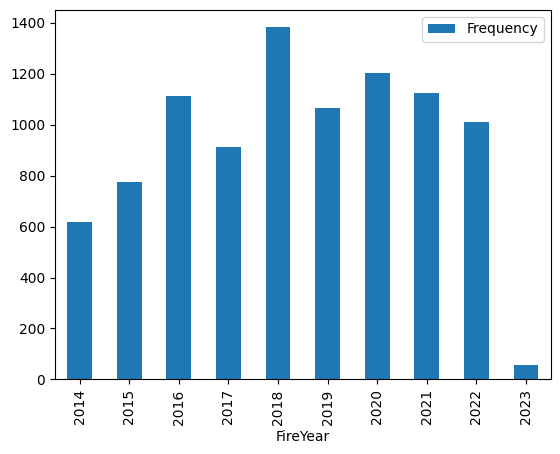

In [181]:
df_CO_frequency = pd.DataFrame(df_CO.FireYear.value_counts()).reset_index()
df_CO_frequency.columns = ['FireYear', 'Frequency']
df_CO_frequency.sort_values(by='FireYear', inplace=True)
df_CO_frequency[df_CO_frequency.FireYear>2013].plot(kind ='bar', x = 'FireYear')

In [236]:
df_TX.dtypes

X                                         float64
Y                                         float64
OBJECTID                                    int64
SourceOID                                   int64
ADSPermissionState                         object
ContainmentDateTime                        object
ControlDateTime                            object
CreatedBySystem                            object
IncidentSize                              float64
DiscoveryAcres                            float64
DispatchCenterID                           object
FireCause                                  object
FireCode                                   object
FireDiscoveryDateTime         datetime64[ns, UTC]
FireOutDateTime                            object
GACC                                       object
IncidentName                               object
IncidentTypeCategory                       object
IncidentTypeKind                           object
InitialLatitude                           float64


In [124]:
df_TX['FireYear'] = pd.DatetimeIndex(df_TX.FireDiscoveryDateTime).year

/var/folders/dx/sc89948n7r9d_y3ms23yc8c40000gn/T/ipykernel_97208/2744592547.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_TX['FireYear'] = pd.DatetimeIndex(df_TX.FireDiscoveryDateTime).year


In [197]:
df_TX.IncidentTypeKind.value_counts()

FI    7879
FM       3
Name: IncidentTypeKind, dtype: int64

In [97]:
df_TX.FireDiscoveryDateTime

dtype('O')

In [241]:
df_TX.IncidentSize.astype('float64')
df_TX.loc[164].IncidentSize == pd.NA

<NA>

In [221]:
df_TX.iloc[i]

X                                                         -93.977007
Y                                                          30.844355
OBJECTID                                                      297681
SourceOID                                                   23877212
ADSPermissionState                                           DEFAULT
ContainmentDateTime                           2023/03/01 04:50:59+00
ControlDateTime                               2023/03/01 05:06:00+00
CreatedBySystem                                                wires
IncidentSize                                                    0.42
DiscoveryAcres                                                  0.42
DispatchCenterID                                               TXTIC
FireCause                                               Undetermined
FireCode                                                         NaN
FireDiscoveryDateTime                      2023-03-01 02:55:00+00:00
FireOutDateTime                   